## Pix2Pix for Dehazing
- Generator : Improved Encoder-Decoder with Res in Parallel

In [1]:
import os
import tensorflow as tf
import matplotlib.pyplot as plt

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

In [2]:
PATH = '/kaggle/input/haze1k/Distributed_haze1k/'
BATCH_SIZE = 4
image_shape = (256,256,3)

## Loading data into tf.data
- There are some corrupted files in the dataset Which have been removed prior

In [3]:
def load_image(image_path):
    '''Load and preprocess the image'''
    img = tf.io.read_file(image_path)
    img = tf.io.decode_png(img, channels=3)
    img = tf.image.resize(img, [256, 256])
    img = (img / 127.5) - 1.0
    
    return img

def load_paired_data(real_image_path, fake_image_path):
    real_image = load_image(real_image_path)
    fake_image = load_image(fake_image_path)
    
    return real_image, fake_image

In [4]:
def load_dataset(PATH, test_ds = False):
    haze_images_paths = os.listdir(PATH + 'input')
    haze_images_paths = [PATH + 'input/'+  item   for item in haze_images_paths]
    haze_images_paths.sort()
    
    clear_images_paths = os.listdir(PATH + 'target')
    clear_images_paths = [PATH + 'target/'+  item   for item in clear_images_paths]
    clear_images_paths.sort()
    
    dataset = tf.data.Dataset.from_tensor_slices((haze_images_paths, clear_images_paths))
    dataset = dataset.map(load_paired_data, num_parallel_calls = tf.data.AUTOTUNE)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    
    if test_ds == True:
        dataset = dataset.batch(1)
        return dataset
    
    dataset = dataset.batch(BATCH_SIZE)
    
    return dataset

In [5]:
train_ds = load_dataset(PATH + 'train/')

In [6]:
print(len(train_ds))

225


In [7]:
moderate_test_ds = load_dataset(PATH + 'test_moderate/', test_ds=True)
thick_test_ds = load_dataset(PATH + 'test_thick/', test_ds=True)
thin_test_ds = load_dataset(PATH + 'test_thin/', test_ds=True)

In [8]:
print(len(moderate_test_ds), len(thick_test_ds), len(thin_test_ds))

45 45 45


### Visualizing the Data

In [9]:
def subplot(img1, img2, title1, title2):
    fig, axes = plt.subplots(nrows=1, ncols=2)
    img1 = (img1[0] + 1) / 2.0
    img2 = (img2[0] + 1) / 2.0

    axes[0].imshow(img1)
    axes[0].set_title(title1)
    axes[0].axis('off')

    axes[1].imshow(img2)
    axes[1].set_title(title2)
    axes[1].axis('off')
    plt.show()

(4, 256, 256, 3)


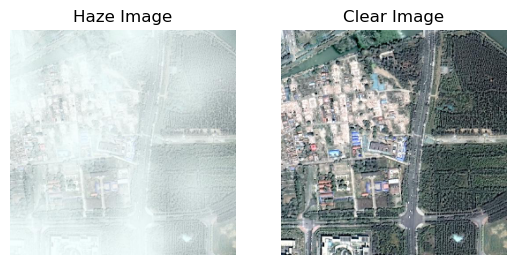

In [10]:
haze_image, clear_image  = next(iter(train_ds))
print(haze_image.shape)
subplot(haze_image, clear_image, 'Haze Image', 'Clear Image')

## Arch

In [11]:
from tensorflow.keras import Model, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers

## Generator

<div style="text-align:center">
    <p>Following <b>b</b></p>
    <img src="https://lh6.googleusercontent.com/4ClRkeoQX3NPNpIoeP6C6y9sr1kSrFQfPff8s81BuJjrCp3B1G8dgwlQW3N1JGKWQWZdKBM1jduV3Hq9zUq6Mbc7GlGfjSmjUClixoDwsXNCy9OtbXKVewBaXHUcmxouVjjKW1KU" /></div>

In [12]:
class ResNeXtBlock(tf.keras.layers.Layer):
    def __init__(self, filters, cardinality=32, strides=1, activation='relu', **kwargs):
        super(ResNeXtBlock, self).__init__(**kwargs)
        
        self.filters = filters
        self.cardinality = cardinality
        self.strides = strides
        self.activation = activation
        
        self.concat1 = layers.Concatenate(axis=-1)

        # Creating separate convolution layers for each group
        self.conv1_layers = [
            layers.Conv2D(self.filters, kernel_size=(1, 1), strides=1, padding='same', activation=self.activation)
            for _ in range(self.cardinality)
        ]

        self.conv2_layers = [
            layers.Conv2D(self.filters, kernel_size=(3, 3), strides=self.strides, padding='same', activation=self.activation)
            for _ in range(self.cardinality)
        ]

        # Convolution layer for concatenating group outputs
        self.conv_concat = layers.Conv2D(self.filters, kernel_size=(1, 1), strides=1, padding='same')
        self.shortcut_conv = layers.Conv2D(self.filters, kernel_size=(1,1), strides=self.strides, padding='same')
        self.add = layers.Add()
        self.act = layers.Activation(self.activation)

    def call(self, inputs):
        shortcut = inputs
        groups = tf.split(inputs, self.cardinality, axis=-1)
        group_outputs = []

        for i in range(self.cardinality):
            x = groups[i]
            x = self.conv1_layers[i](x)
            x = self.conv2_layers[i](x)
            group_outputs.append(x)

        x = self.concat1(group_outputs)
        x = self.conv_concat(x)

        if self.strides != 1 or inputs.shape[-1] != self.filters:
            shortcut = self.shortcut_conv(inputs)

        x = self.add([x, shortcut])
        x = self.act(x)

        return x

In [13]:
from tensorflow.keras.initializers import RandomNormal

class Generator(tf.keras.Model):
    def __init__(self):
        super(Generator, self).__init__()

        init = RandomNormal(stddev=0.02, seed=123)
        self.conv1 = layers.Conv2D(64, (7, 7), padding='same', kernel_initializer=init)
        self.norm1 = layers.BatchNormalization(axis=-1)
        self.relu1 = layers.Activation('relu')

        self.conv2 = layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same', kernel_initializer=init)
        self.norm2 = layers.BatchNormalization(axis=-1)
        self.relu2 = layers.Activation('relu')

        self.conv3 = layers.Conv2D(256, (3, 3), strides=(2, 2), padding='same', kernel_initializer=init)
        self.norm3 = layers.BatchNormalization(axis=-1)
        self.relu3 = layers.Activation('relu')
    
        self.resnext_blocks = [ResNeXtBlock(256) for _ in range(7)]

        self.deconv1 = layers.Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same', kernel_initializer=init)
        self.norm4 = layers.BatchNormalization(axis=-1)
        self.relu4 = layers.Activation('relu')

        self.deconv2 = layers.Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', kernel_initializer=init)
        self.norm5 = layers.BatchNormalization(axis=-1)
        self.relu5 = layers.Activation('relu')

        self.conv4 = layers.Conv2D(3, (7, 7), padding='same', kernel_initializer=init)
        self.norm6 = layers.BatchNormalization(axis=-1)
        self.tanh = layers.Activation('tanh')

    def call(self, inputs):
        x = self.conv1(inputs)
        x = self.norm1(x)
        x = self.relu1(x)

        x = self.conv2(x)
        x = self.norm2(x)
        x = self.relu2(x)

        x = self.conv3(x)
        x = self.norm3(x)
        x = self.relu3(x)

        for resnext_block in self.resnext_blocks:
            x = resnext_block(x)

        x = self.deconv1(x)
        x = self.norm4(x)
        x = self.relu4(x)

        x = self.deconv2(x)
        x = self.norm5(x)
        x = self.relu5(x)

        x = self.conv4(x)
        x = self.norm6(x)
        x = self.tanh(x)

        return x
    
    def build_summary(self, input_shape=(256,256,3)):
        inp = Input(shape = input_shape)
        return Model(inputs = [inp], outputs = self.call(inp))

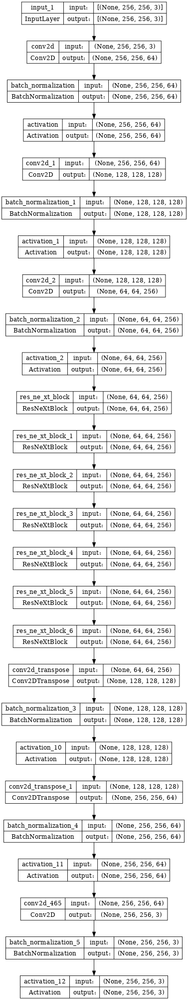

In [14]:
generator = Generator()
tf.keras.utils.plot_model(generator.build_summary(), show_shapes=True, dpi=64)

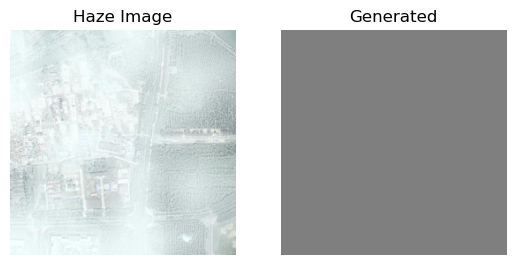

In [15]:
gen_output = generator(haze_image)

subplot(haze_image, gen_output, 'Haze Image', 'Generated')

In [16]:
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=False)

def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    # Mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)
    return total_gen_loss, gan_loss, l1_loss

## Discriminator

In [17]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.init = tf.keras.initializers.RandomNormal(stddev=0.02, seed=123)
        
        self.concat = layers.Concatenate()
        
        self.conv1 = layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', kernel_initializer=self.init)
        self.leaky_relu1 = layers.LeakyReLU(alpha=0.2)
        
        self.conv2 = layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same', kernel_initializer=self.init)
        self.batch_norm2 = layers.BatchNormalization()
        self.leaky_relu2 = layers.LeakyReLU(alpha=0.2)
        
        self.conv3 = layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same', kernel_initializer=self.init)
        self.batch_norm3 = layers.BatchNormalization()
        self.leaky_relu3 = layers.LeakyReLU(alpha=0.2)
        
        self.conv4 = layers.Conv2D(512, (4, 4), strides=(2, 2), padding='same', kernel_initializer=self.init)
        self.batch_norm4 = layers.BatchNormalization()
        self.leaky_relu4 = layers.LeakyReLU(alpha=0.2)
        
        self.conv5 = layers.Conv2D(512, (4, 4), padding='same', kernel_initializer=self.init)
        self.batch_norm5 = layers.BatchNormalization()
        self.leaky_relu5 = layers.LeakyReLU(alpha=0.2)
        
        self.conv6 = layers.Conv2D(1, (4, 4), padding='same', kernel_initializer=self.init)
        self.sigmoid = layers.Activation('sigmoid')
        
    def call(self, inp, tar):
        x = self.concat([inp, tar])
       
        x = self.conv1(x)
        x = self.leaky_relu1(x)
        
        x = self.conv2(x)
        x = self.batch_norm2(x)
        x = self.leaky_relu2(x)
        
        x = self.conv3(x)
        x = self.batch_norm3(x)
        x = self.leaky_relu3(x)
        
        x = self.conv4(x)
        x = self.batch_norm4(x)
        x = self.leaky_relu4(x)
        
        x = self.conv5(x)
        x = self.batch_norm5(x)
        x = self.leaky_relu5(x)
        
        x = self.conv6(x)
        patch_out = self.sigmoid(x)
        
        return patch_out
    
    def build_summary(self, input_shape=(256,256,3)):
        inp = Input(shape = input_shape)
        tar = Input(shape = input_shape)
        return Model(inputs = [inp, tar], outputs = self.call(inp, tar))

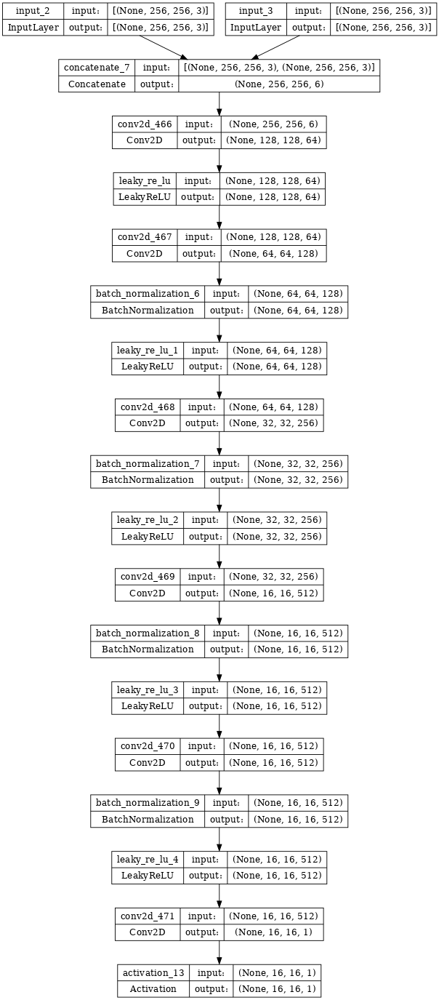

In [18]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator.build_summary(image_shape), show_shapes=True, dpi=64)

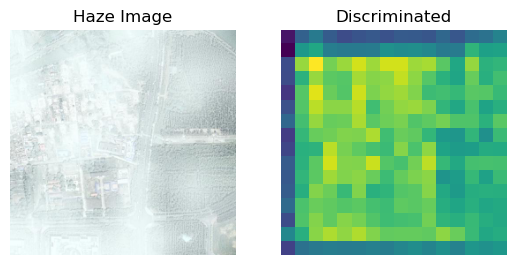

In [19]:
disc_output = discriminator(gen_output, haze_image)

subplot(haze_image, disc_output, 'Haze Image', 'Discriminated')

In [20]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss

## Optimizers

In [21]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

## Pix2Pix

In [22]:
class Pix2Pix(Model):
    def __init__(
        self,
        clear_generator,
        clear_discriminator,
    ):
        super(Pix2Pix, self).__init__()
        self.c_gen = clear_generator
        self.c_disc = clear_discriminator
        
    def compile(
        self,
        c_gen_optimizer,        
        c_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
    ):
        super(Pix2Pix, self).compile()
        self.c_gen_optimizer = generator_optimizer
        self.c_disc_optimizer = discriminator_optimizer
        self.gen_loss_fn = generator_loss
        self.disc_loss_fn = discriminator_loss
        
    def train_step(self, batch_data):
        haze, clear = batch_data
        
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            gen_output = self.c_gen(haze, training=True)

            disc_real_output = self.c_disc(haze, clear, training=True)
            disc_generated_output = self.c_disc(haze, gen_output, training=True)

            gen_total_loss, gen_gan_loss, gen_l1_loss = self.gen_loss_fn(disc_generated_output, gen_output, clear)
            disc_loss = self.disc_loss_fn(disc_real_output, disc_generated_output)

        generator_gradients = gen_tape.gradient(
            gen_total_loss, self.c_gen.trainable_variables
        )
        discriminator_gradients = disc_tape.gradient(
            disc_loss, self.c_disc.trainable_variables
        )

        self.c_gen_optimizer.apply_gradients(
            zip(generator_gradients, self.c_gen.trainable_variables)
        )
        self.c_disc_optimizer.apply_gradients(
            zip(discriminator_gradients, self.c_disc.trainable_variables)
        )
    
        return {
            'gen_total_loss': gen_total_loss,
            'gen_gan_loss' : gen_gan_loss,
            'gen_l1_loss' : gen_l1_loss,
            'disc_loss' : disc_loss   
        }

## Callback for saving results after 5 epochs

In [23]:
inp_img, tar_img = next(iter(moderate_test_ds))
def save_images(gen, test_input, name, step):
    pred_by_gen = gen(test_input)
    
    test_input = (test_input[0]+ 1)/2.0    
    pred_by_gen = (pred_by_gen[0]+1)/2.0
    
    plt.figure(figsize=(12, 12))

    display_list = [test_input, pred_by_gen]
    title = ['Input Image', 'Generated Image']

    for i in range(2):
        plt.subplot(1, 2, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i])
        plt.axis('off')
        
    filename = '%s_generated_plot_%06d.png' % (name, (step+1))
    plt.savefig(filename)
    plt.close()

In [24]:
class ReportCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if (epoch+1)%5 == 0:
            save_images(generator, inp_img, 'CtoH', epoch)

In [25]:
from tensorflow.keras.callbacks import CSVLogger

callbacks = [
    CSVLogger('/kaggle/working/training_res.csv'),
    ReportCallback()
]

## Training

In [26]:
pix2pix_gan = Pix2Pix(generator, discriminator)

pix2pix_gan.compile(c_gen_optimizer=generator_optimizer,
                  c_disc_optimizer=discriminator_optimizer,
                  gen_loss_fn=generator_loss,
                  disc_loss_fn=discriminator_loss)

In [27]:
%%time
hist = pix2pix_gan.fit(train_ds, epochs=125, batch_size = BATCH_SIZE, callbacks=callbacks, verbose=2)

Epoch 1/125
225/225 - 478s - gen_total_loss: 19.6975 - gen_gan_loss: 1.8343 - gen_l1_loss: 0.1786 - disc_loss: 0.6392 - 478s/epoch - 2s/step
Epoch 2/125
225/225 - 291s - gen_total_loss: 30.0322 - gen_gan_loss: 2.0830 - gen_l1_loss: 0.2795 - disc_loss: 0.2243 - 291s/epoch - 1s/step
Epoch 3/125
225/225 - 291s - gen_total_loss: 19.2840 - gen_gan_loss: 3.9234 - gen_l1_loss: 0.1536 - disc_loss: 0.0987 - 291s/epoch - 1s/step
Epoch 4/125
225/225 - 291s - gen_total_loss: 18.5369 - gen_gan_loss: 5.1258 - gen_l1_loss: 0.1341 - disc_loss: 0.0111 - 291s/epoch - 1s/step
Epoch 5/125
225/225 - 292s - gen_total_loss: 19.1467 - gen_gan_loss: 5.9246 - gen_l1_loss: 0.1322 - disc_loss: 0.0046 - 292s/epoch - 1s/step
Epoch 6/125
225/225 - 291s - gen_total_loss: 18.9544 - gen_gan_loss: 6.2966 - gen_l1_loss: 0.1266 - disc_loss: 0.0031 - 291s/epoch - 1s/step
Epoch 7/125
225/225 - 291s - gen_total_loss: 19.2569 - gen_gan_loss: 7.0899 - gen_l1_loss: 0.1217 - disc_loss: 0.0014 - 291s/epoch - 1s/step
Epoch 8/125
2

### Saving and Loading Generator

In [28]:
generator.save('generator_model')

In [29]:
loaded_generator = tf.keras.models.load_model('/kaggle/working/generator_model')

## Evaluation

In [30]:
ssim_list = []
psnr_list = []

from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

def ssim_evaluation(img1, img2):
    ssim_value = ssim(img1, img2, channel_axis=2, data_range=img2.max() - img2.min())
    ssim_list.append(ssim_value)
    
def psnr_evaluation(img1, img2):
    psnr_value = psnr(img1,img2)
    psnr_list.append(psnr_value)

In [31]:
def evaluate_model(model, inp, tar, sno):
    pred = model(inp, training=True)
    plt.figure(figsize=(15, 15))
    
    inp = inp[0].numpy()
    inp = (inp + 1)/2.0
    tar = tar[0].numpy()
    tar = (tar + 1)/2.0
    pred = pred[0].numpy()
    pred = (pred + 1)/2.0
    
    ## ssim
    ssim_curr = ssim_evaluation(tar, pred)
    
    ## psnr
    psnr_curr = psnr_evaluation(tar, pred)
    
    display_list = [inp, tar, pred]
    title = ['Haze Image', 'Ground Truth', 'Predicted Image']
   
    if sno<=5:
        for i in range(3):
            plt.subplot(1, 3, i+1)
            plt.title(title[i])
            plt.imshow(display_list[i])
            plt.axis('off')
        plt.show()
    plt.close()

In [32]:
import pandas as pd
skeleton = {
        'SSIM': [],
        'PSNR': []
}

In [33]:
import statistics

def evaluate_test(test_ds, name):
    for i, (inp, tar) in test_ds.take(len(test_ds)).enumerate():
        evaluate_model(loaded_generator, inp, tar, i)
        
    ssim_mean = statistics.mean(ssim_list)
    psnr_mean = statistics.mean(psnr_list)
    
    print('Dataset-{}'.format(name))
    print(ssim_mean)
    print(psnr_mean)
    
    
    skeleton['SSIM'].append(ssim_mean)
    skeleton['PSNR'].append(psnr_mean)
        
    ssim_list.clear()
    psnr_list.clear()
    

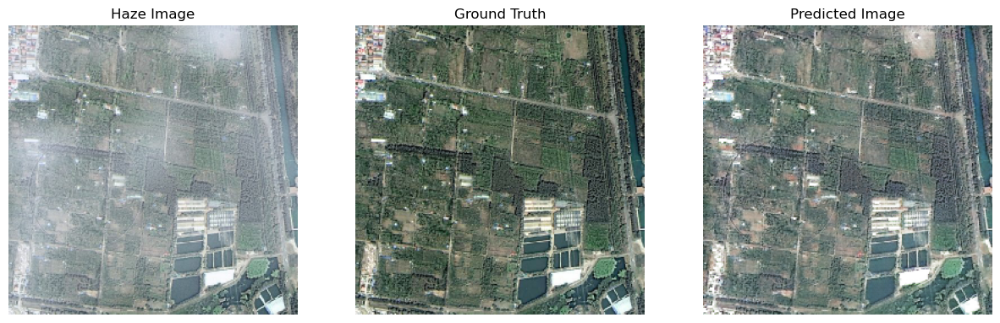

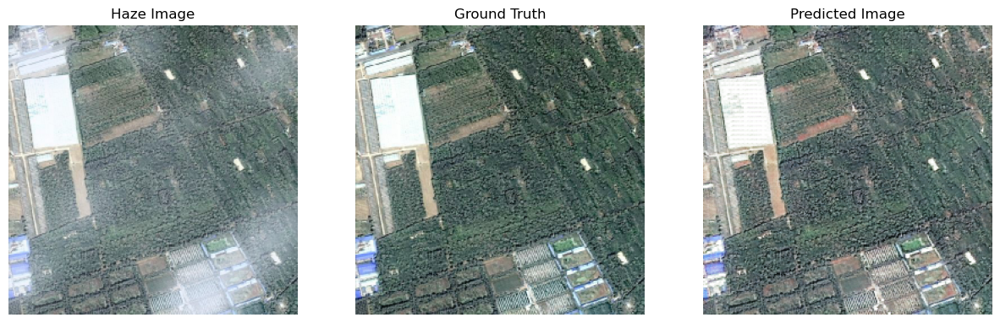

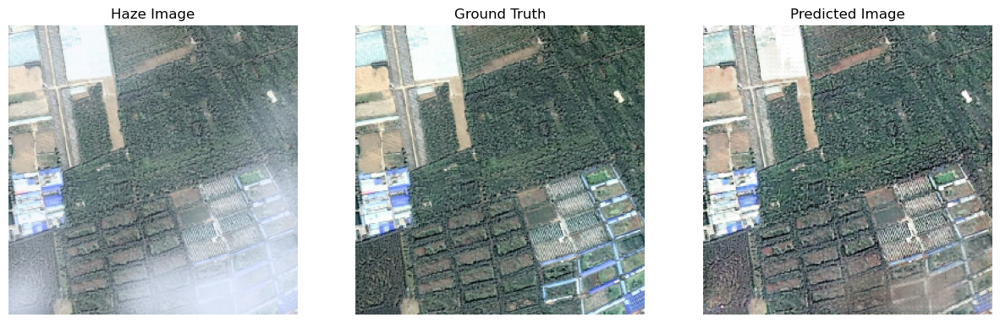

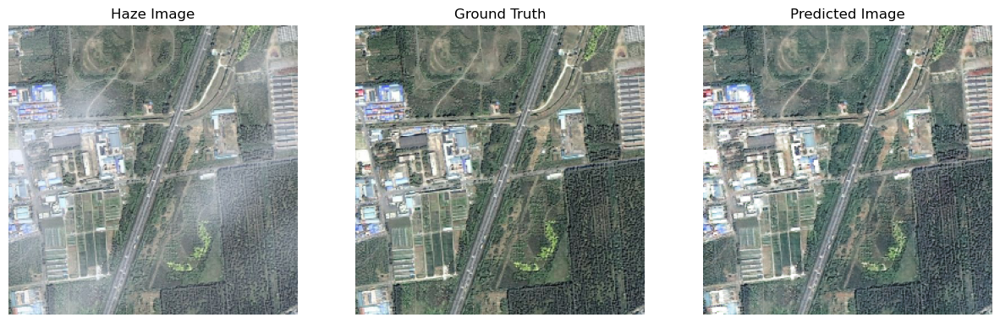

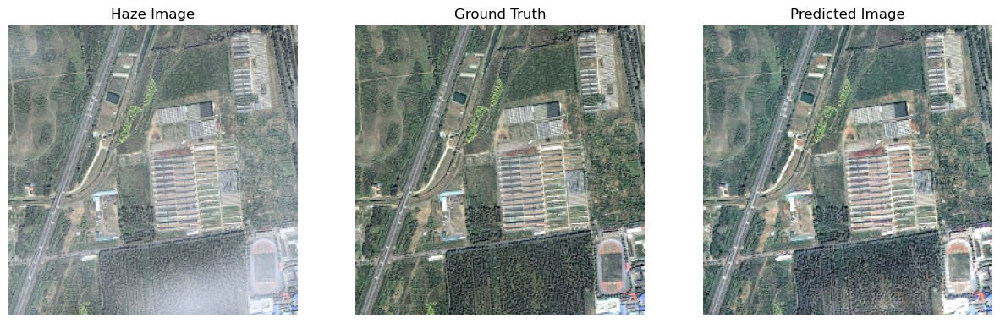

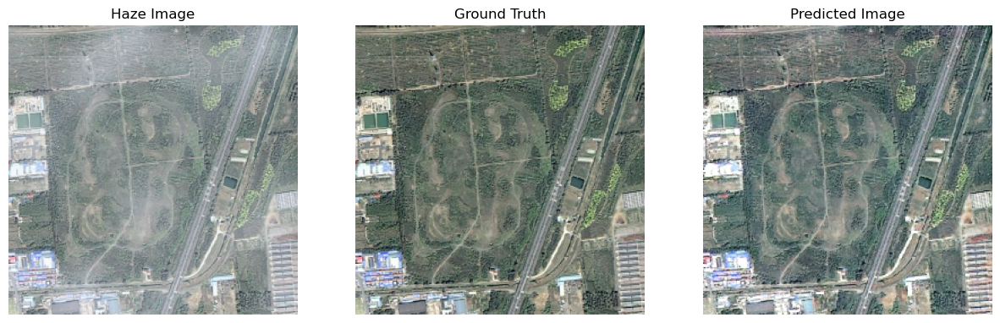

Dataset-Moderate
0.9281872
23.01630324399316


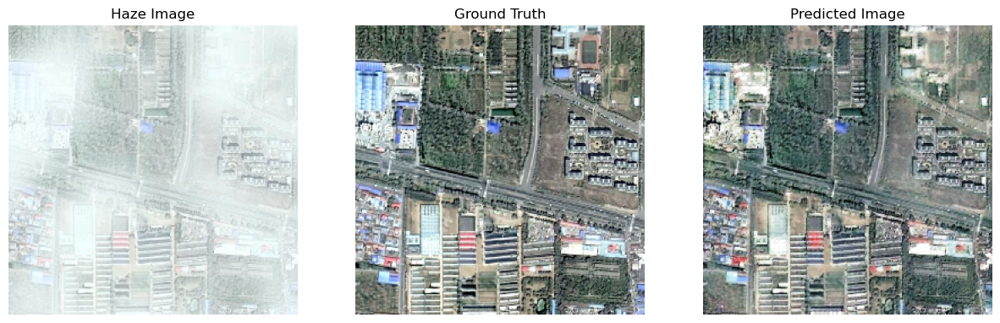

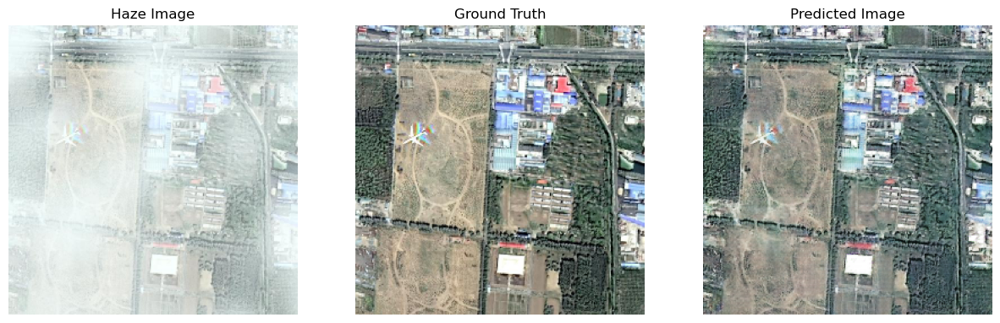

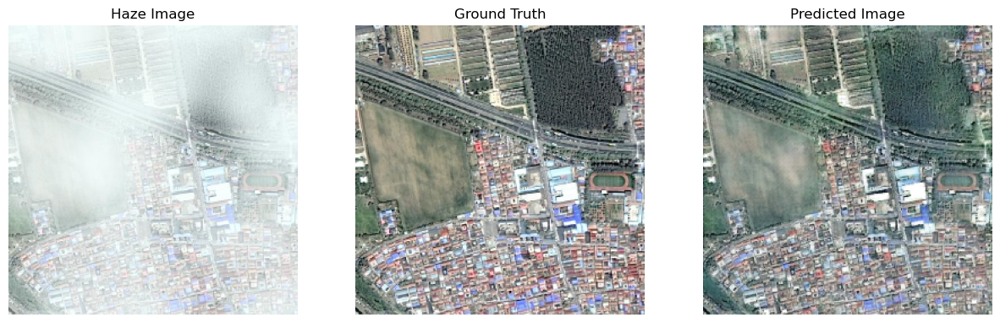

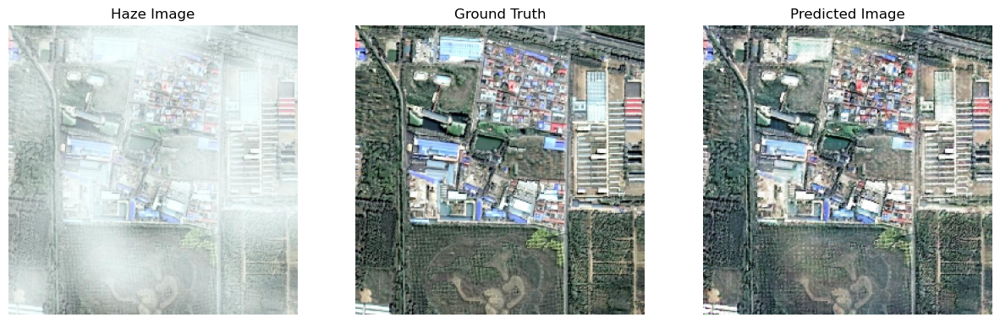

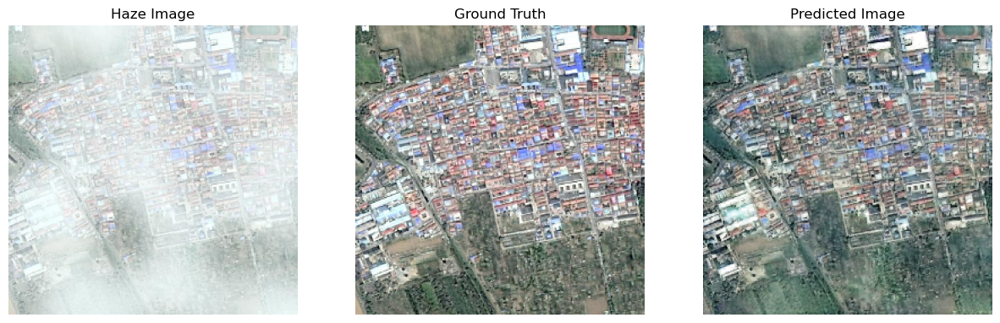

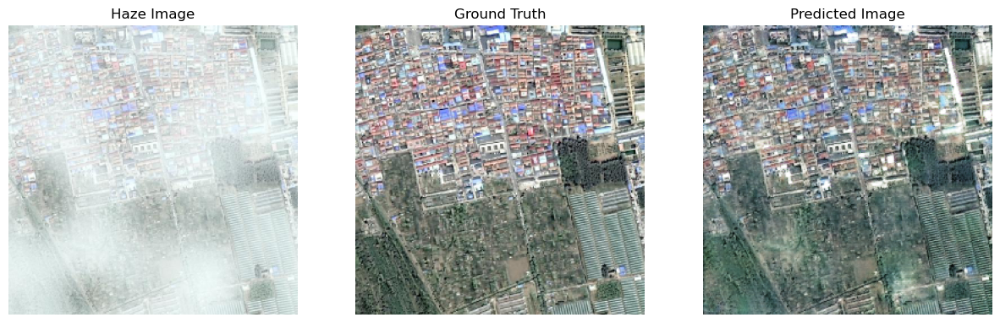

Dataset-Thick
0.89097196
21.465408159563662


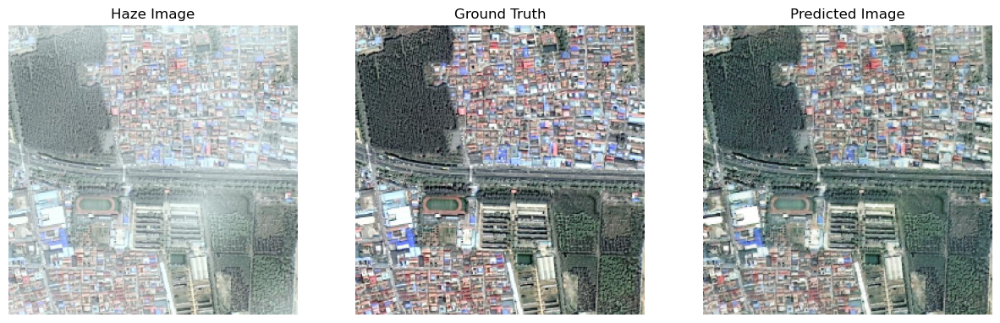

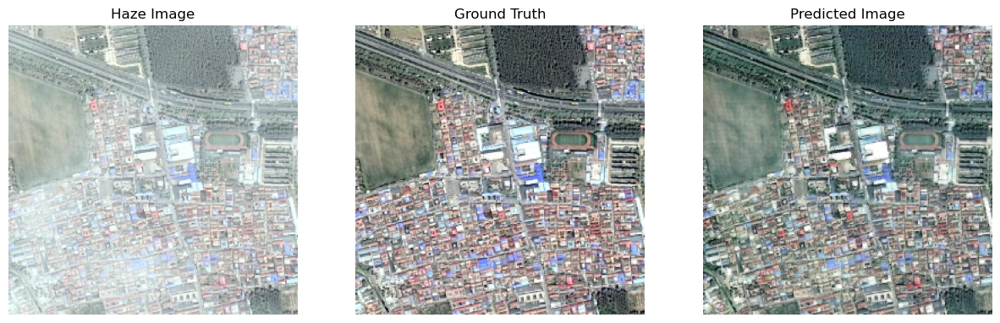

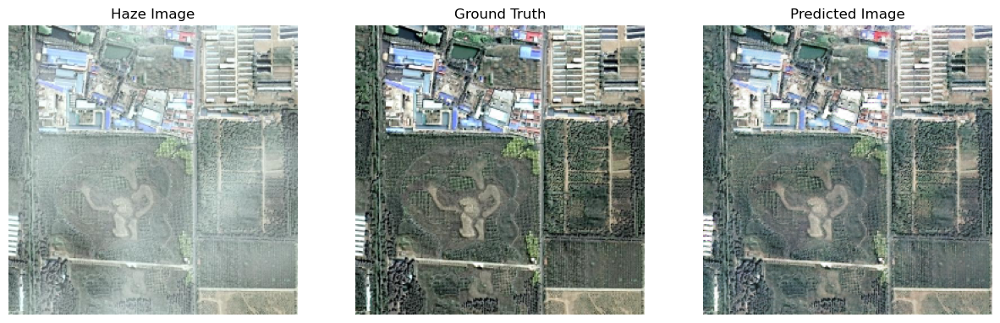

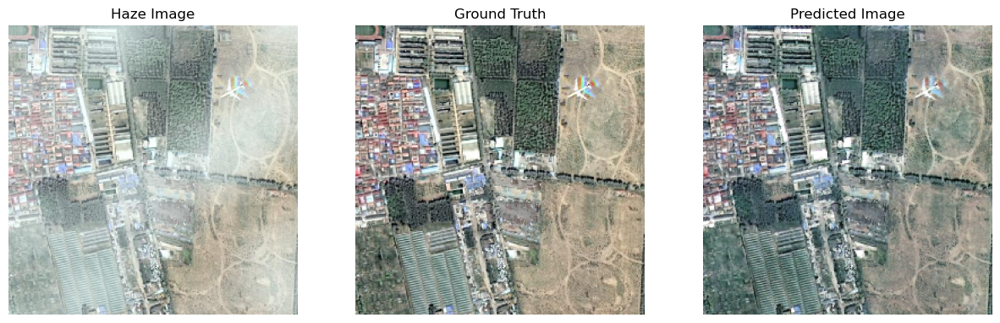

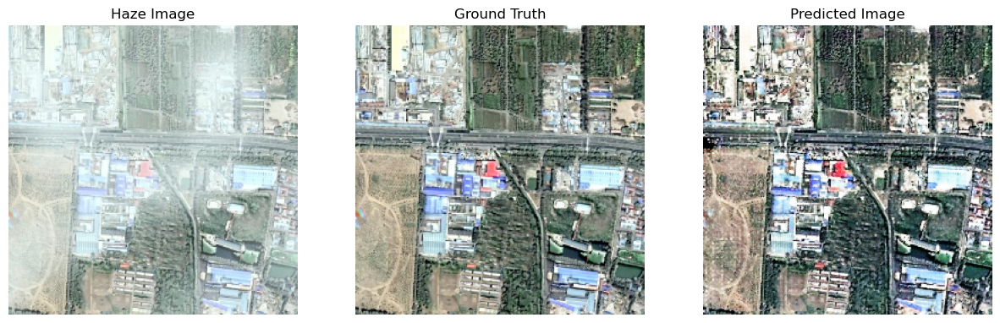

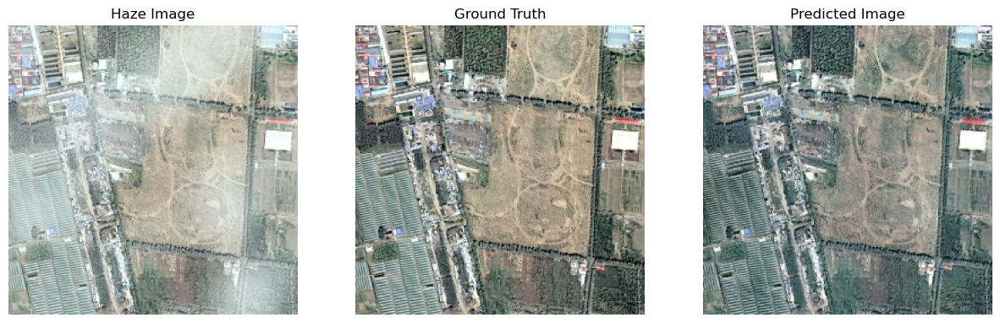

Dataset-Thin
0.9124453
22.275705076084158


In [34]:
evaluate_test(moderate_test_ds, 'Moderate')
evaluate_test(thick_test_ds, 'Thick')
evaluate_test(thin_test_ds, 'Thin')

In [35]:
df_res = pd.DataFrame(skeleton, index = ["Mod", "Thick", "Thin"])
df_res

,SSIM,PSNR
Mod,0.928187,23.016303
Thick,0.890972,21.465408
Thin,0.912445,22.275705
